# Comparing different ap_pipe runs

The latest "standard" ap_pipe rerun on the HiTS2015 dataset is `cw_processed6`.

Other runs include... 
* instcal (not technically ap_pipe but effectively equivalent; uses instcals as both template and science), DM-19525
* calexp (uses calexps as both template and science), DM-19526

In [1]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import itertools
import importlib

from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize
import astropy.units as u
import astropy.coordinates as coord

import lsst.geom
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
from lsst.ap.association import UnpackPpdbFlags, MapDiaSourceConfig
from lsst.utils import getPackageDir

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
from diaObjectAnalysis import loadAllPpdbObjects, loadAllPpdbSources, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve

In [137]:
# Only if you change anything in the code imported above
importlib.reload(plc)

<module 'plotLightcurve' from '/project/mrawls/ap_pipe-notebooks/plotLightcurve.py'>

In [3]:
# Reference rerun
repoRef = '/project/mrawls/hits2015/rerun/cw_processed6'
butlerRef = dafPersist.Butler(repoRef)
dbNameRef = 'association.db'
dbPathRef = os.path.join(repoRef, dbNameRef)
rerunNameRef = 'cw_processed6'

In [4]:
# Instcal rerun
repoInst = '/project/gkovacs/hits_proc2019-07-03/repo/'
butlerInst = dafPersist.Butler(repoInst)
dbNameInst = 'rerun/imgDiff_2019-07-04/association.db'
dbPathInst = os.path.join(repoInst, dbNameInst)
rerunNameInst = 'imgDiff_2019-07-03'

In [5]:
# Calexp rerun
repoCalexp = '/project/gkovacs/hits15_14/ingested/rerun/apPipe_2019-07-15'
butlerCalexp = dafPersist.Butler(repoCalexp)
dbNameCalexp = 'association.db'
dbPathCalexp = os.path.join(repoCalexp, dbNameCalexp)
rerunNameCalexp = 'apPipe_2019-07-15'

In [6]:
objTableRef = loadAllPpdbObjects(repoRef, dbNameRef)
objTableInst = loadAllPpdbObjects(repoInst, dbNameInst)
objTableCalexp = loadAllPpdbObjects(repoCalexp, dbNameCalexp)

In [7]:
srcTableRef = loadAllPpdbSources(repoRef, dbNameRef)
srcTableInst = loadAllPpdbSources(repoInst, dbNameInst)
srcTableCalexp = loadAllPpdbSources(repoCalexp, dbNameCalexp)

<IPython.core.display.Javascript object>


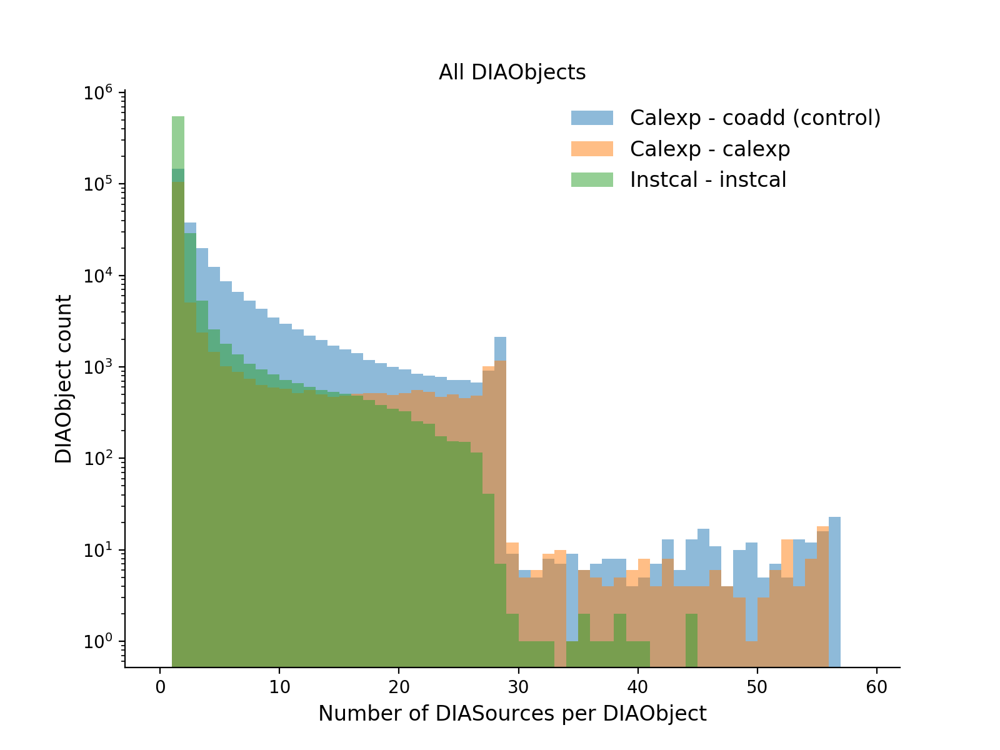

Text(0.5, 1.0, 'All DIAObjects')

In [8]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
#plt.ylim(0.7, 1e5)
plt.yscale('log')
plt.hist(objTableRef['nDiaSources'].values, bins=np.arange(0, 60), color='C0', alpha=0.5, label='Calexp - coadd (control)')
plt.hist(objTableCalexp['nDiaSources'].values, bins=np.arange(0, 60), color='C1', alpha=0.5, label='Calexp - calexp')
plt.hist(objTableInst['nDiaSources'].values, bins=np.arange(0, 60), color='C2', alpha=0.5, label='Instcal - instcal')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('All DIAObjects')

In [16]:
def makeSrcTableFlags(srcTbl, objTbl):
    config = MapDiaSourceConfig()
    unpacker = UnpackPpdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(srcTbl['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=srcTbl.index)
    srcTableFlags = pd.merge(srcTbl, flagTable, left_index=True, right_index=True)
    flagFilter = ((srcTableFlags['base_PixelFlags_flag_bad']) | 
                  (srcTableFlags['base_PixelFlags_flag_suspect']) |
                  (srcTableFlags['base_PixelFlags_flag_saturatedCenter']) |
                  (srcTableFlags['slot_Shape_flag'])
                 )
    noFlagFilter = ~flagFilter
    goodSrc = srcTableFlags.loc[noFlagFilter]
    goodObjIds = set(srcTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObj = objTbl.loc[objTbl['diaObjectId'].isin(goodObjIds)]
    badObj = objTbl.loc[~objTbl['diaObjectId'].isin(goodObjIds)]
    return flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, goodSrc, goodObj, badObj

In [17]:
flagTableRef, flagValuesRef, srcRef,  \
    yesFlagRef, noFlagRef, goodSrcRef, goodObjRef, badObjRef = makeSrcTableFlags(srcTableRef, objTableRef)
flagTableInst, flagValuesInst, srcInst, \
    yesFlagInst, noFlagInst, goodSrcInst, goodObjInst, badObjInst = makeSrcTableFlags(srcTableInst, objTableInst)
flagTableCalexp, flagValuesCalexp, srcCalexp, \
    yesFlagCalexp, noFlagCalexp, goodSrcCalexp, goodObjCalexp, badObjCalexp = makeSrcTableFlags(srcTableCalexp, objTableCalexp)

<IPython.core.display.Javascript object>


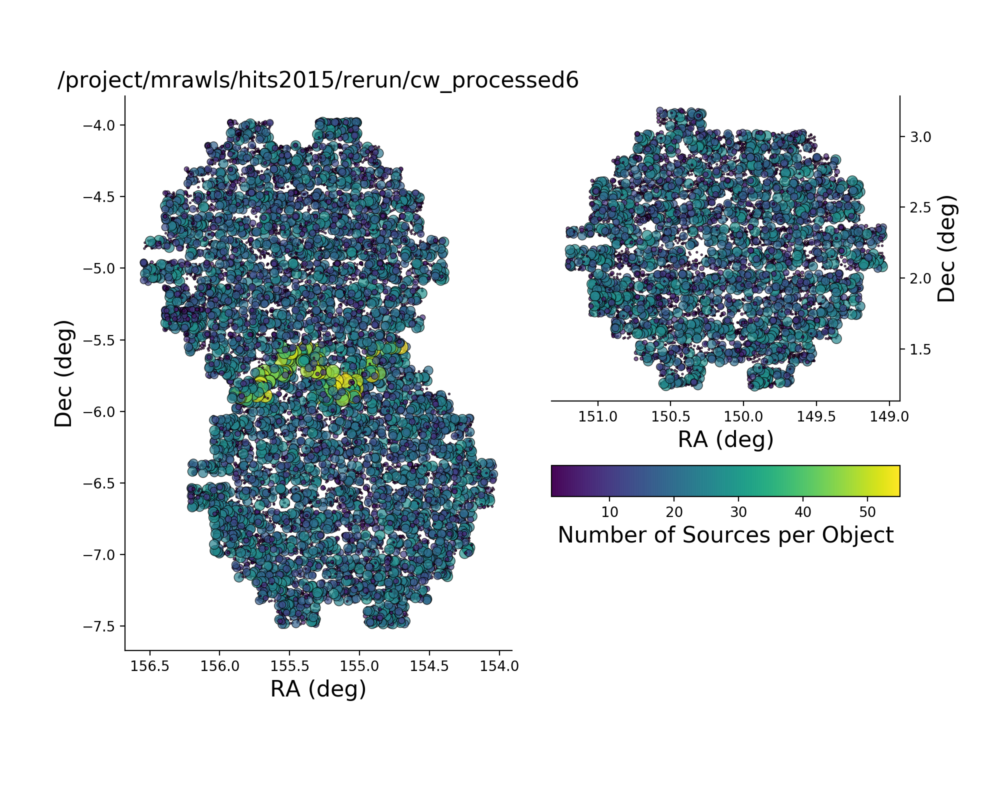

In [24]:
objFilterRef = (goodObjRef['nDiaSources'] > 0)
fig1 = plotDiaObjectsOnSky(repoRef, goodObjRef, objFilterRef, hits=True)

<IPython.core.display.Javascript object>


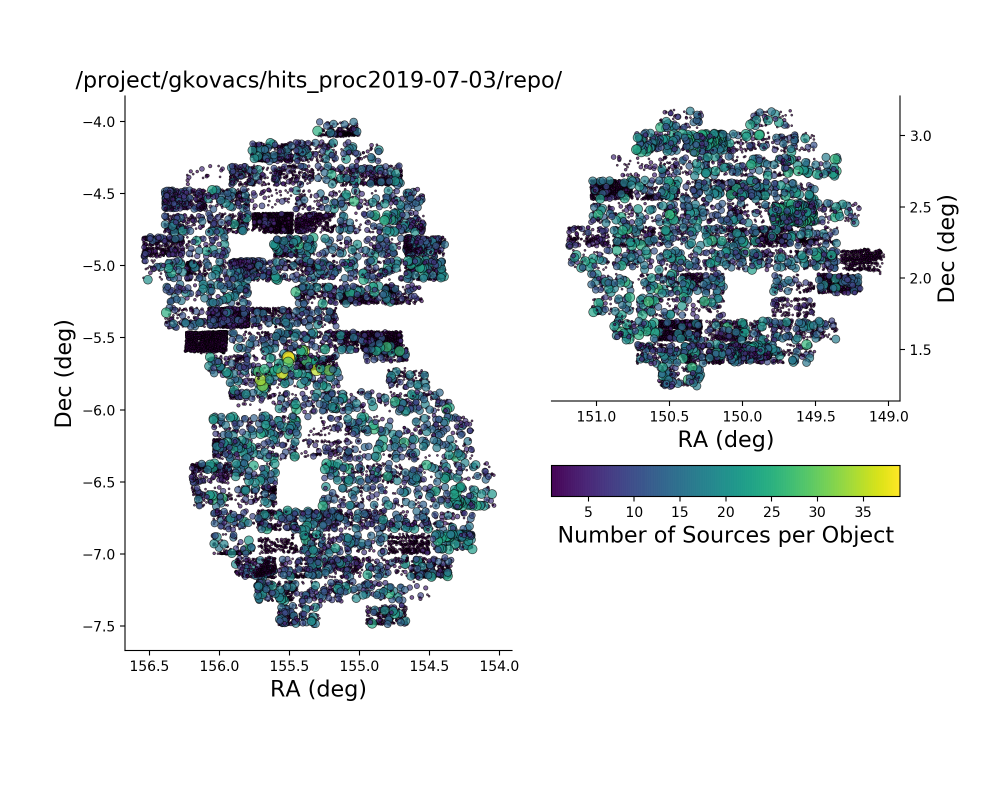

In [23]:
objFilterInst = (goodObjInst['nDiaSources'] > 0)
fig2 = plotDiaObjectsOnSky(repoInst, goodObjInst, objFilterInst, hits=True)

<IPython.core.display.Javascript object>


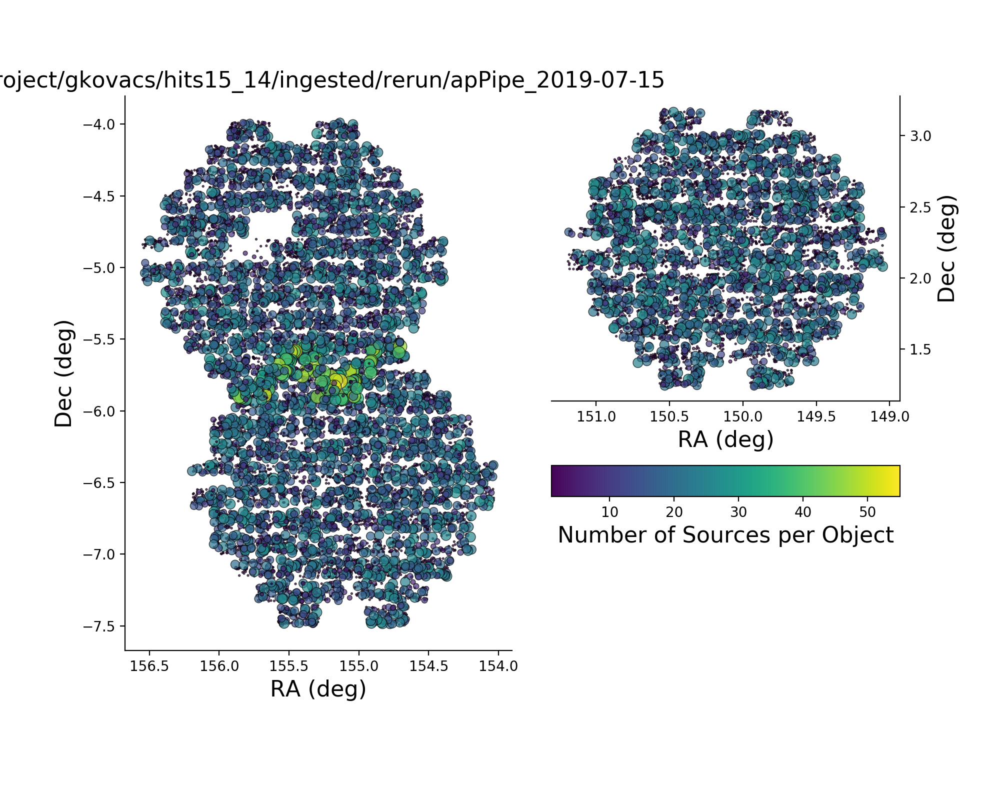

In [26]:
objFilterCalexp = (goodObjCalexp['nDiaSources'] > 0)
fig3 = plotDiaObjectsOnSky(repoCalexp, goodObjCalexp, objFilterCalexp, hits=True)

In [11]:
def plotZoomedRegion(objTable, srcTable):
    fig = plt.figure(figsize=(9,6))
    plt.scatter(srcTable['ra'], 
                srcTable['decl'], 
                color='C1', s=5, alpha=0.3)
    plt.scatter(objTable.loc[(objTable['nDiaSources'] >= 20), 'ra'], 
                objTable.loc[(objTable['nDiaSources'] >= 20), 'decl'], 
                color='C0', s=15, alpha=0.3)
    plt.xlabel('RA (deg)')
    plt.ylabel('Dec (deg)')
    plt.gca().set_xlim(155.3, 154.8)
    plt.gca().set_ylim(-6.02, -5.60)
    #plt.gca().invert_xaxis()
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    #box = plt.gca().get_position()
    #plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
    #plt.legend(bbox_to_anchor=(0.97, 0.9))

<IPython.core.display.Javascript object>


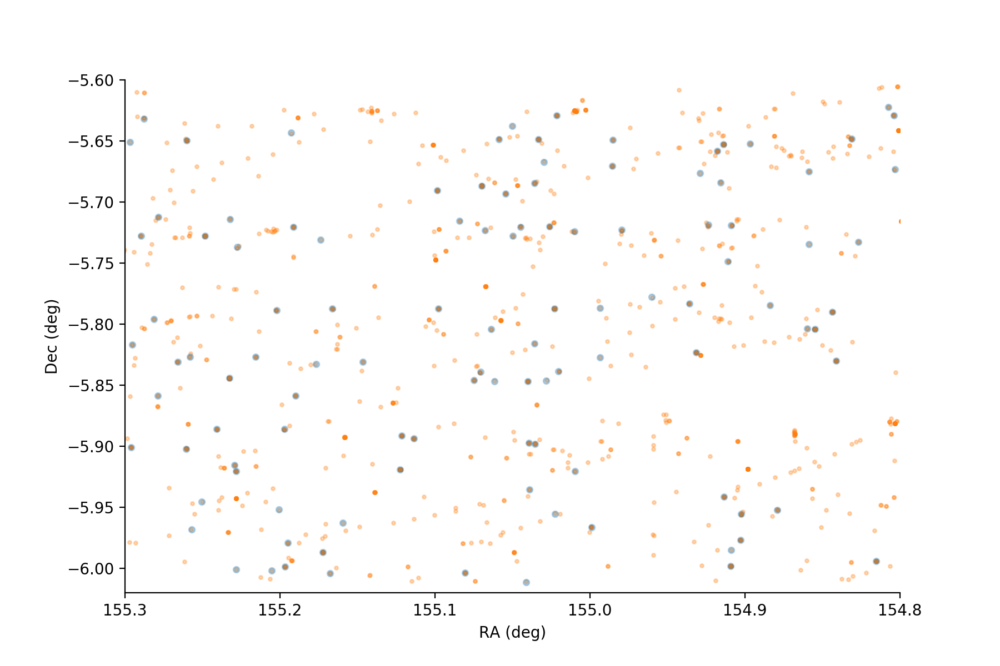

In [66]:
plotZoomedRegion(goodObjRef, goodSrcRef)

<IPython.core.display.Javascript object>


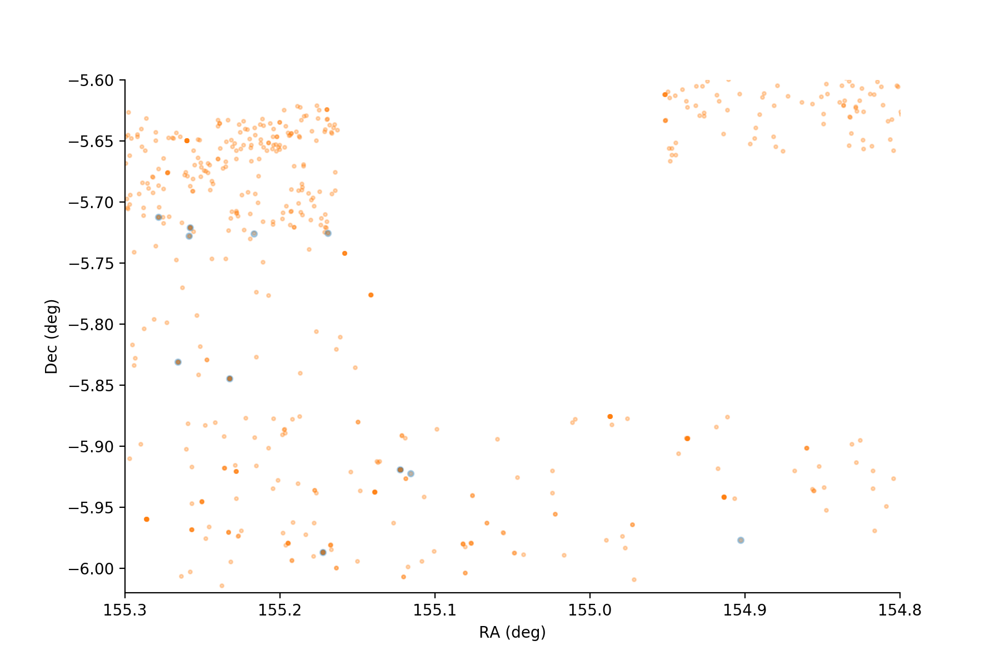

In [67]:
plotZoomedRegion(goodObjInst, goodSrcInst)

<IPython.core.display.Javascript object>


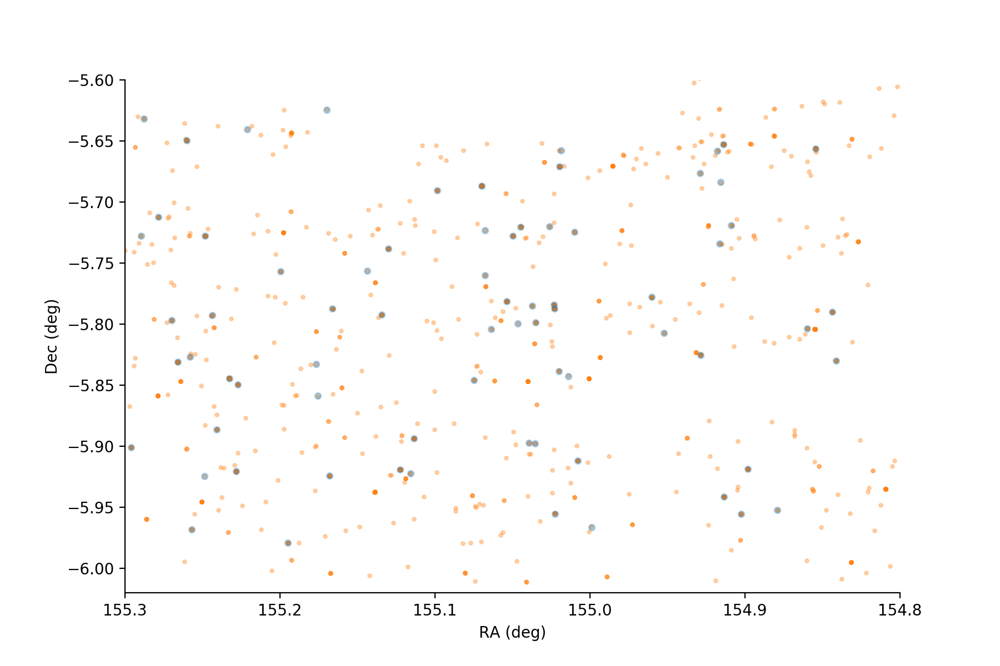

In [68]:
plotZoomedRegion(goodObjCalexp, goodSrcCalexp)

<IPython.core.display.Javascript object>


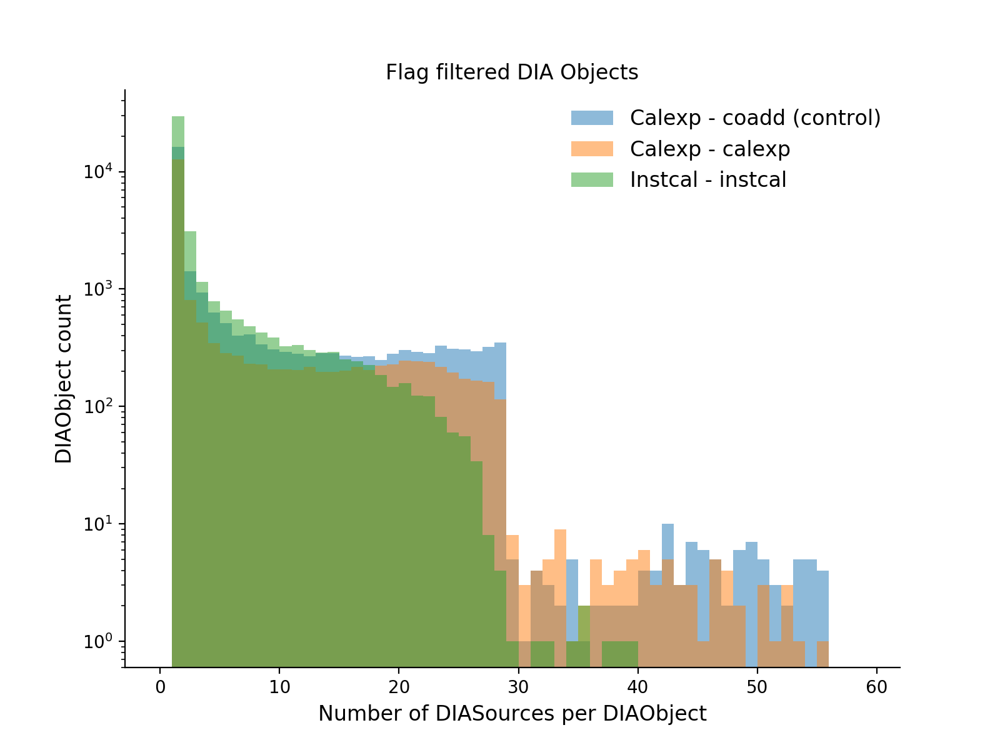

Text(0.5, 1.0, 'Flag filtered DIA Objects')

In [33]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')
plt.hist(goodObjRef['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C0', alpha=0.5, label='Calexp - coadd (control)')
plt.hist(goodObjCalexp['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C1', alpha=0.5, label='Calexp - calexp')
plt.hist(goodObjInst['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='Instcal - instcal')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flag filtered DIA Objects')

<IPython.core.display.Javascript object>


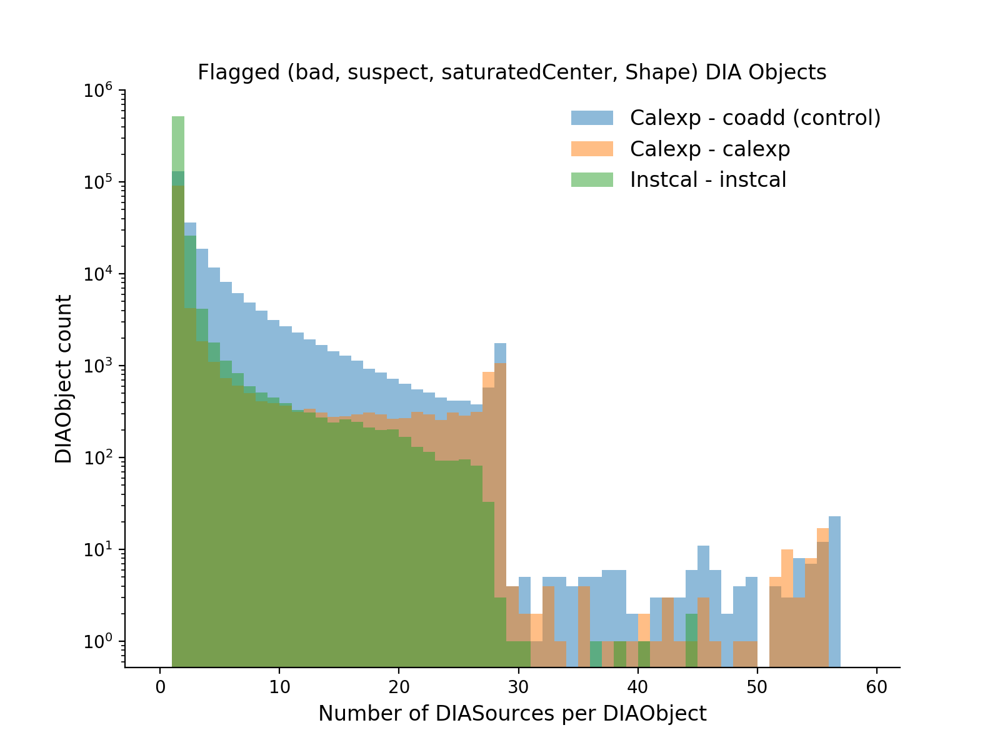

Text(0.5, 1.0, 'Flagged (bad, suspect, saturatedCenter, Shape) DIA Objects')

In [20]:
# Similar plot as above, but now with the BAD things instead of the good things
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')
plt.hist(badObjRef['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C0', alpha=0.5, label='Calexp - coadd (control)')
plt.hist(badObjCalexp['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C1', alpha=0.5, label='Calexp - calexp')
plt.hist(badObjInst['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='Instcal - instcal')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flagged (bad, suspect, saturatedCenter, Shape) DIA Objects')

In [33]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 29  # because we're doing custom slicing below

    fig, ax = plt.subplots(figsize=(9,9))

    pixelflags = ax.barh(labels[0:8], flags[0:8], color='C0')
    pixelcenterflags = ax.barh(labels[8:12], flags[8:12], color='C1')
    centroidflags = ax.barh(labels[12:15], flags[12:15], color='C4')
    apfluxflags = ax.barh(labels[15:17], flags[15:17], color='C5')
    psffluxflags = ax.barh(labels[17:20], flags[17:20], color='C2')
    ip_diffimflags = ax.barh(labels[20:23], flags[20:23], color='C5')
    shapeflags = ax.barh(labels[23::], flags[23::], color='C3')

    #ax.xaxis.set_tick_params(rotation=89)
    fig.subplots_adjust(left=0.35)
    ax.set_xlabel('Number of flagged DIASources')

    ax.legend((pixelflags[0],
               pixelcenterflags[0],
               centroidflags[0],
               apfluxflags[0], 
               psffluxflags[0],
               ip_diffimflags[0],
               shapeflags[0]), 
              ('Pixel flags', 
               'Pixel center flags',
               'Centroid flags',
               'ApFlux flags',
               'PsfFlux flags',
               'ip_diffim flags',
               'Shape flags'),
              frameon=False, loc='upper right', ncol=2
             )

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().set_xlim([0, 720000])
    plt.title(title)

<IPython.core.display.Javascript object>


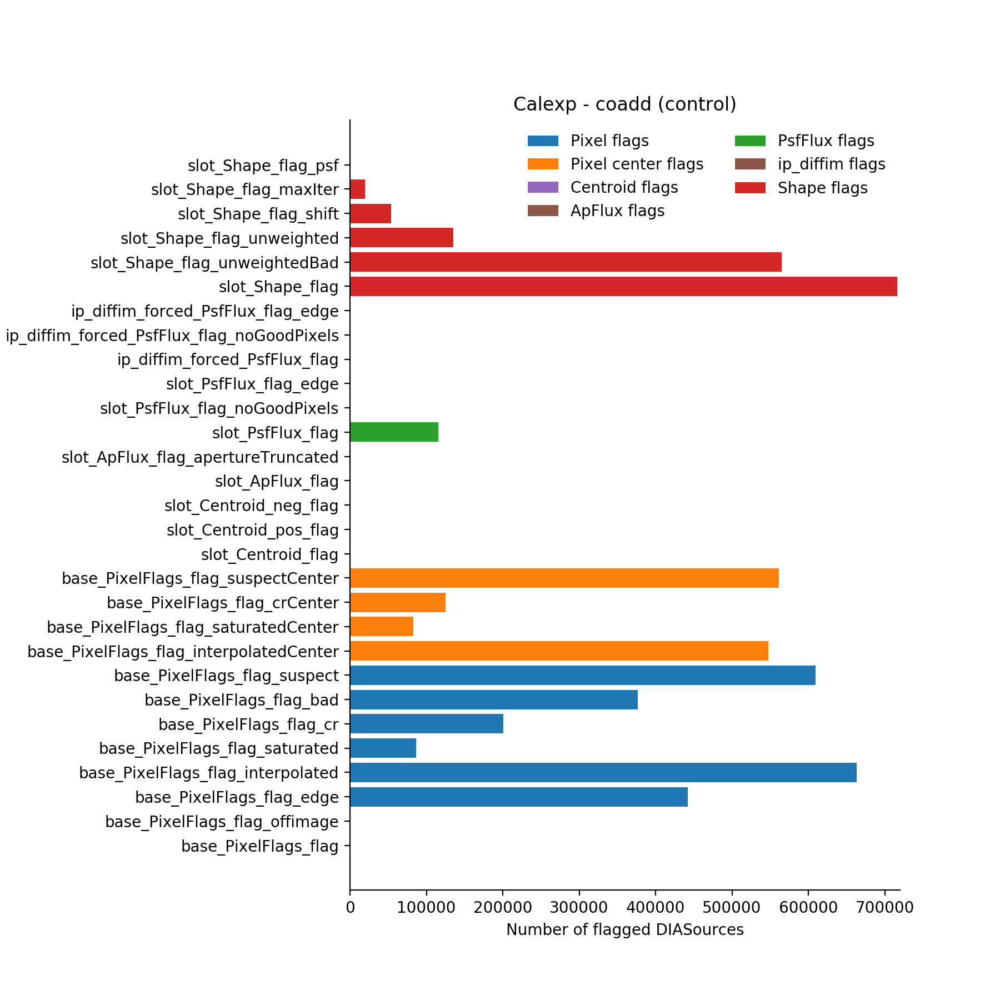

In [34]:
plot_flag_hist([count for count in flagTableRef.sum().values], 
               flagValuesRef.dtype.names, title='Calexp - coadd (control)')

<IPython.core.display.Javascript object>


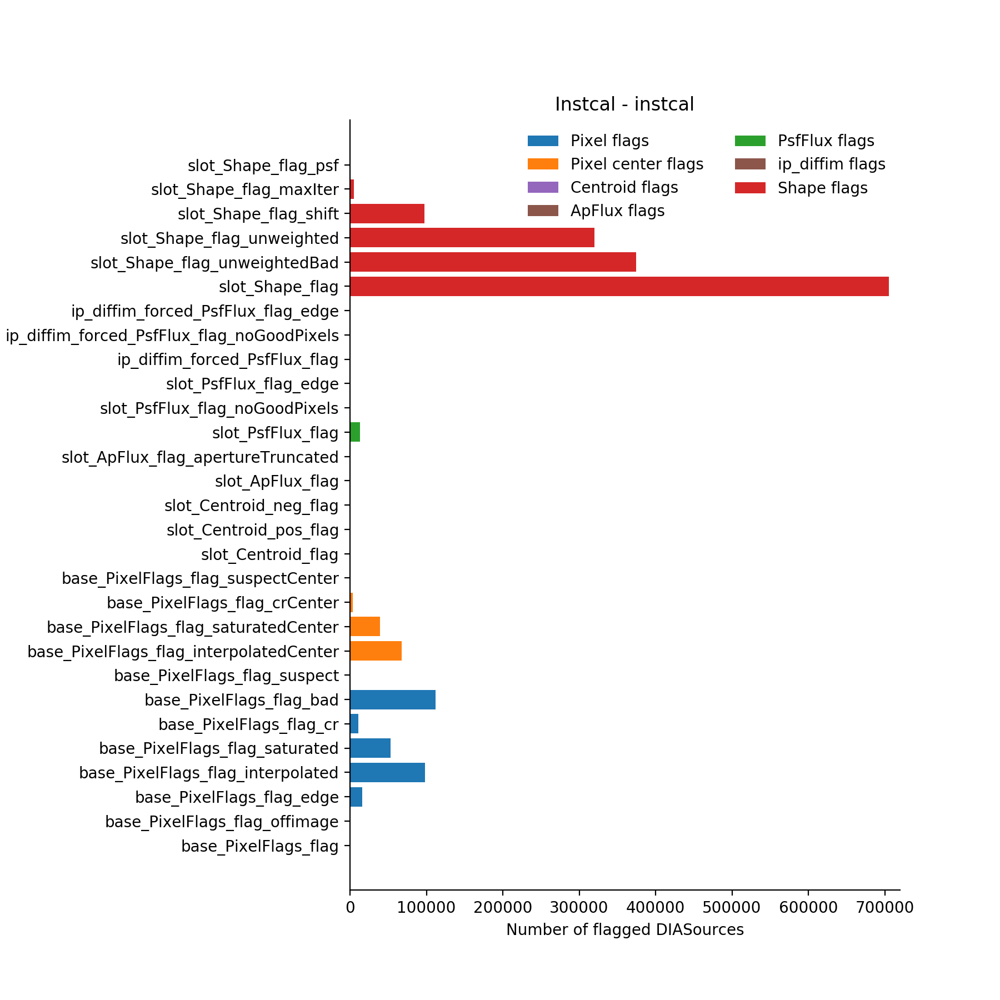

In [35]:
plot_flag_hist([count for count in flagTableInst.sum().values], 
               flagValuesInst.dtype.names, title='Instcal - instcal')

<IPython.core.display.Javascript object>


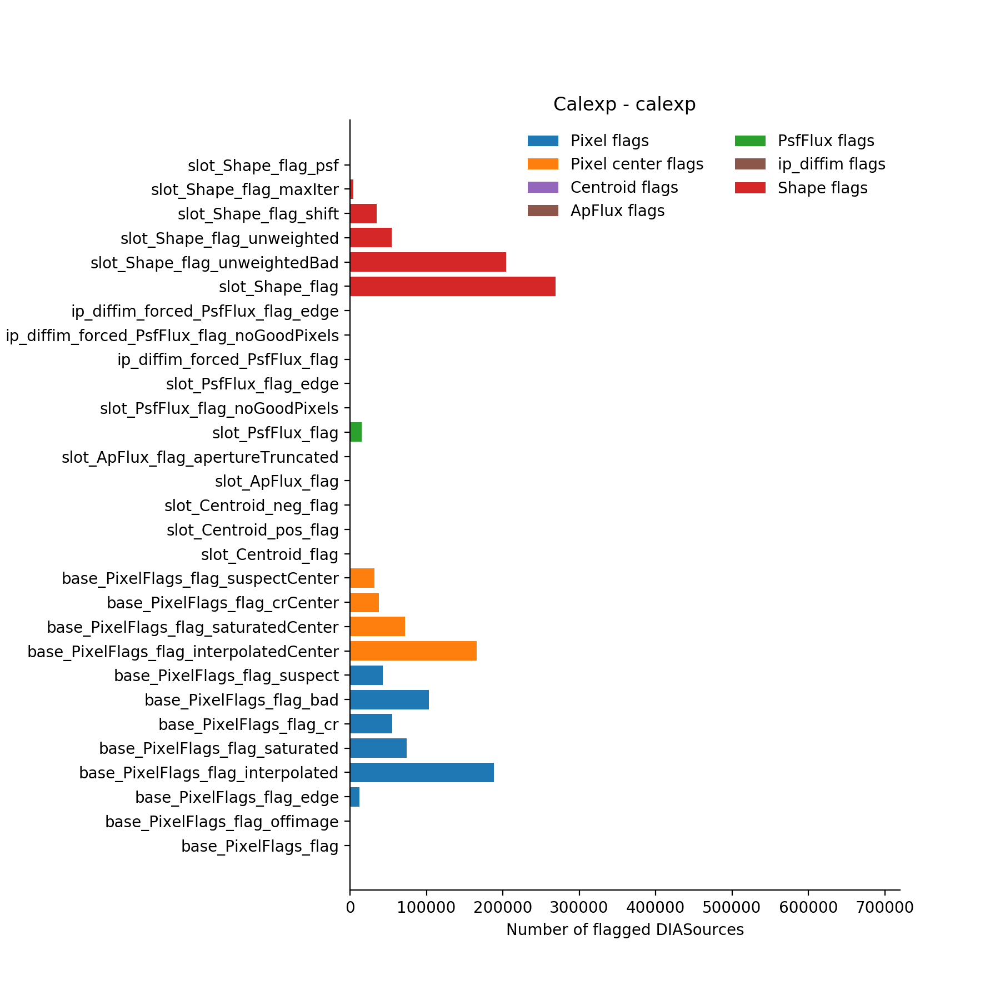

In [36]:
plot_flag_hist([count for count in flagTableCalexp.sum().values], 
               flagValuesCalexp.dtype.names, title='Calexp - calexp')

We need to fix problems in the processing and difference imaging causing lots of FATAL errors before we can really continue with this, because of course there are fewer sources and objects if a bunch of dataIds failed! One main processCcd problem seems to be astrometry related in instcals.

### Instcal processing failures

ProcessCcd
* 134 IndexErrors stating No viable PSF candidates survive
   * these all originate in `processCcd.charImage.measurePsf.psfDeterminer`
* 2 IndexErrors stating arrays used as indices must be of integer (or boolean) type
   * these originate in `processCcd.calibrate.photoCal`, specifically a failure in `getZeroPoint`
* 76 RuntimeErrors stating No matches to use for photocal
   * these all originate in `processCcd.calibrate.photoCal.reserve`
* 31 RuntimeErrors stating Unable to measure aperture correction for required algorithm 'base_GaussianFlux'
   * these all originate in `processCcd.charImage.measureApCorr`
* 11 RuntimeErrors stating Unable to match sources
   * these sometimes happen in calibrate and sometimes in charImage
* 1 RuntimeError stating No objects passed our cuts for consideration as psf stars (`processCcd.charImage.measurePsf`)
* 1 RuntimeError stating All matches rejected in iteration 1 (`processCcd.calibrate.astrometry.matcher`)
* 301 TaskErrors representing astrometry failure (Fit failed: median scatter on sky = X arcsec > 10.000 config.maxScatterArcsec)
   * these occur all over the place, but do include a full field's worth of ccdnum 29 and a full field's worth of ccdnum 5
* 1 ValueError stating cannot convert floatNaN to integer (somewhere in `processCcd.calibrate`)
* 1 ValueError stating zero-size array to reduction operation maximum which has no identity (something in numpy relating to `processCcd.calibrate.astrometry.referenceSelector`)
(Total 557)

In addition, there are 102 instances of `processCcd.calibrate.astrometry INFO: Fit WCS iter 2 failed; using previous iteration: Fit failed: median scatter on sky = 12.393 arcsec > 10.000 config.maxScatterArcsec`, which also indicate an astrometry failure but did not stop a calexp from being created.

ImageDifference
* 350 "No locations for get" because the calexp cannot be found; essentially a duplicate of one of the above errors
* 104 RuntimeErrors
   * 97 of these are No candidates in candidateList
   * 6 of these are Cannot find any objects suitable for KernelCandidacy
   * 1 of these is "Input images do not overlap at all"
   * (These probably overlap with the 102 instances of the astrometry failure that was logged as INFO above)
* 40 Exceptions resulting from `imageDifference.subtract ERROR: ERROR: Unable to calculate psf matching kernel`
* 2 OverflowErrors originating during `imageDecorrelation.py`
(Total 496)

Grand total 557 + 496 - 350 = 703


### Calexp processing failures

* 29 TaskErrors representing astrometry failure (Fit failed: median scatter on sky = X arcsec > 10.000 config.maxScatterArcsec)
   * 28 of these occur on ccdnum=22 in field Blind15A_42 and 1 is on ccdnum=32 in field Blind15A_26
* 23 Exceptions of the "Unable to determine kernel sum; 0 candidates" variety which relates to something in difference imaging
   * 22 of these are on ccdnum=29 in field Blind15A_42 and 1 is on ccdnum=47 in field Blind15A_26
* 63 FitsErrors apparently related to writing calexps and source catalogs which I have never seen before
   * These are on a variety of ccds/visits/fields but always on 2015-02-19
* 84 RuntimeErrors due to attempting to process ccdnum=2 which does not exist
* 1 RuntimeError from measureApCorr in which base_PsfFlux has 0 sources but requires at least 2

Grand total = 200 - 84 = 116

Given that there are about 5040 total dataIds being processed (60 ccds x 28 visits x 3 fields), the failure rate is 14% for instcals and 2% for calexps.

## Raw DIASource Counts

In [34]:
# Total number of DIASources in each rerun
print(len(srcTableRef), len(srcTableInst), len(srcTableCalexp))

976816 780245 375818


In [35]:
# Total number of flag-filtered DIASources in each rerun
print(len(goodSrcRef), len(goodSrcInst), len(goodSrcCalexp))

53477 53842 37903


In [36]:
# Number of successfully processed dataIds (visit + ccdnum combinations in all 3 fields)
# Calculated as 3 fields x 60 CCDs x 28 visits
nDataIdsRef = 5040
nDataIdsInst = nDataIdsRef - 703
nDataIdsCalexp = nDataIdsRef - 116

In [37]:
# Average number of total DIASources per ccd
print(len(srcTableRef)/nDataIdsRef, len(srcTableInst)/nDataIdsInst, len(srcTableCalexp)/nDataIdsCalexp)

193.8126984126984 179.9043117362232 76.32372055239642


In [38]:
# Average number of flag-filtered DIASources per ccd
print(len(goodSrcRef)/nDataIdsRef, len(goodSrcInst)/nDataIdsInst, len(goodSrcCalexp)/nDataIdsCalexp)

10.610515873015872 12.414572284989625 7.697603574329813


In [39]:
# Average number of total DIASources per square degree
# This assumes all 62 DECam ccds is equal to 3 square degrees, so 60 functional ccds ~ 2.9 square degrees
print(len(srcTableRef)/(nDataIdsRef*2.9), len(srcTableInst)/(nDataIdsInst*2.9), len(srcTableCalexp)/(nDataIdsCalexp*2.9))

66.831964969896 62.0359695642149 26.31852432841256


In [40]:
# Average number of flag-filtered DIASources per square degree
# This assumes all 62 DECam ccds is equal to 3 square degrees, so 60 functional ccds ~ 2.9 square degrees
print(len(goodSrcRef)/(nDataIdsRef*2.9), len(goodSrcInst)/(nDataIdsInst*2.9), len(goodSrcCalexp)/(nDataIdsCalexp*2.9))

3.6587985769020253 4.280886994824009 2.6543460601137285


## A couple cutouts and light curves

Loading PPDB Sources...
DIAObject ID: 176493769699360981
RA (deg): [155.55145296]
Dec (deg): [-5.62545137]
Number of DIASources: 23


<IPython.core.display.Javascript object>


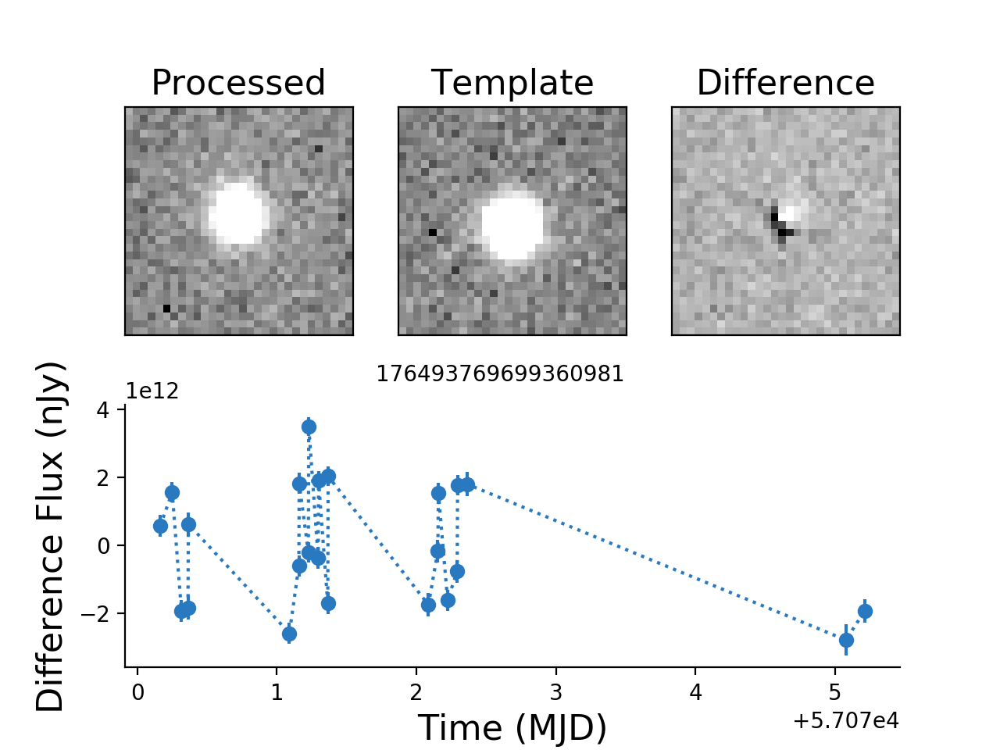

Template dataId {'tract': 0, 'patch': '10,8', 'filter': 'g'}


<IPython.core.display.Javascript object>


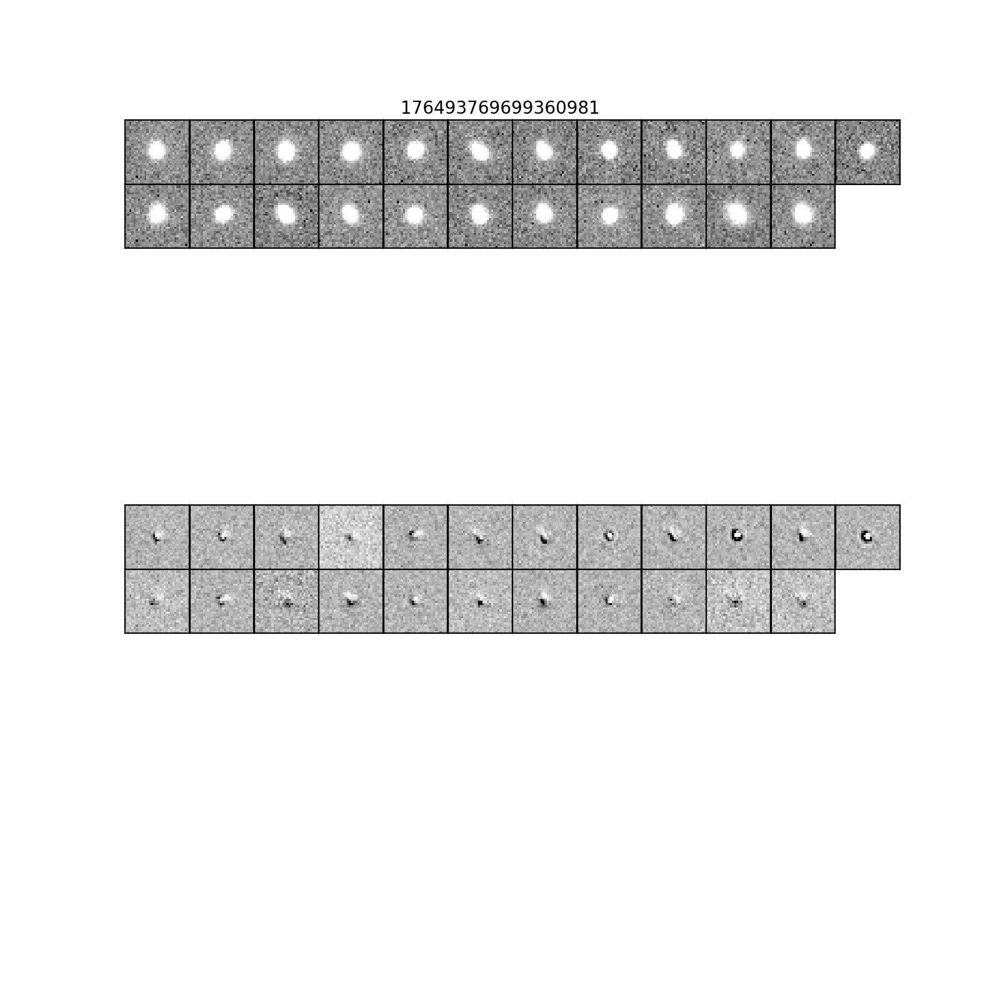

Loading PPDB Sources...
DIAObject ID: 176486738837897796
RA (deg): [150.011458]
Dec (deg): [2.52421207]
Number of DIASources: 23


<IPython.core.display.Javascript object>


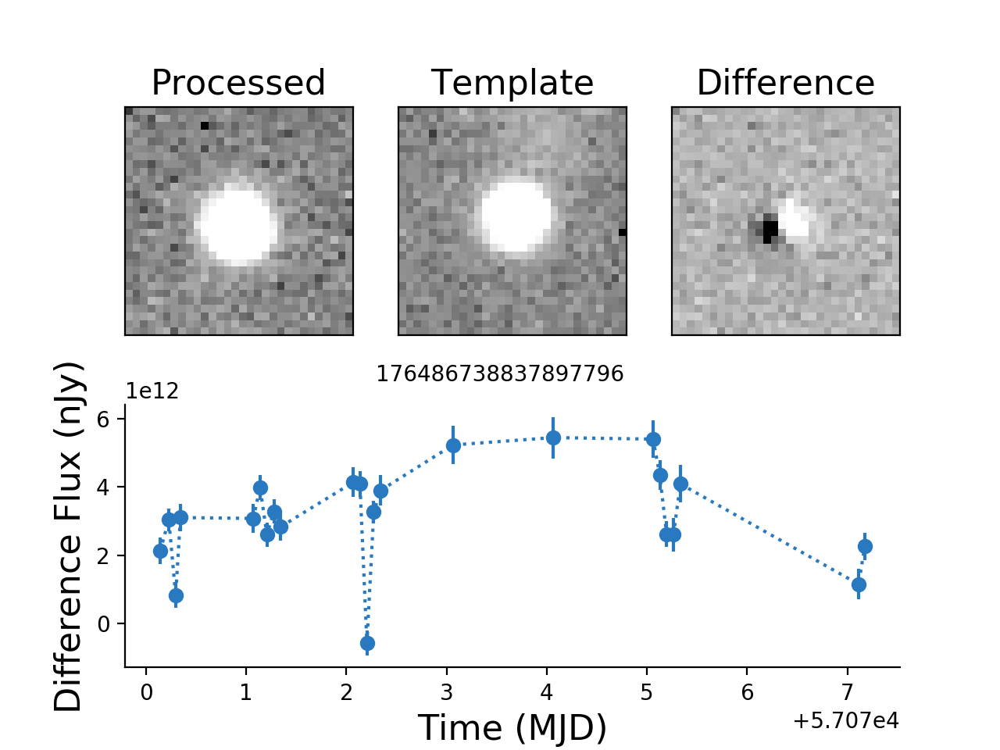

Template dataId {'tract': 0, 'patch': '25,30', 'filter': 'g'}


<IPython.core.display.Javascript object>


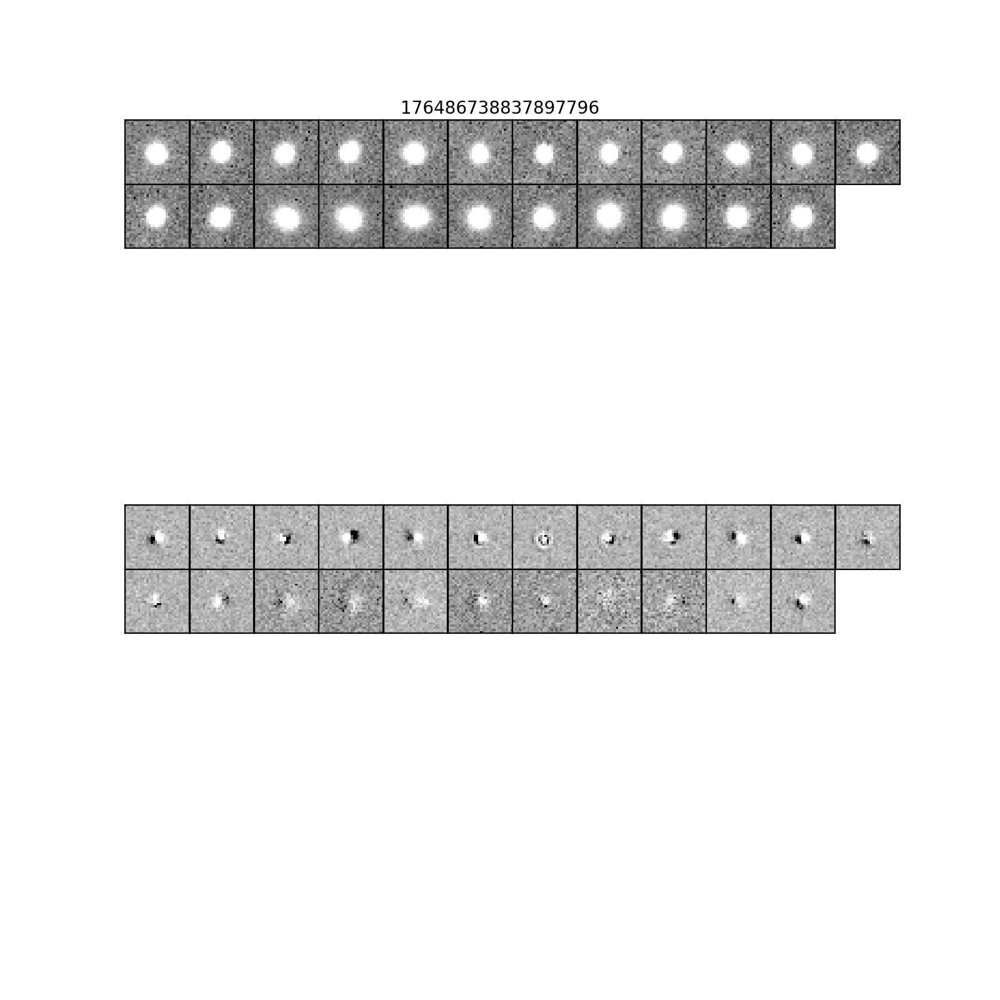

In [202]:
for obj in goodObjRef.loc[(goodObjRef['nDiaSources'] >= 20), 'diaObjectId'].values[0:2]:
    plc.plotLightcurve(obj, goodObjRef, repoRef, dbPathRef, repoRef, plotAllCutouts=True)

Loading PPDB Sources...
DIAObject ID: 176492691662569570
RA (deg): [155.66185172]
Dec (deg): [-5.81860982]
Number of DIASources: 22


<IPython.core.display.Javascript object>


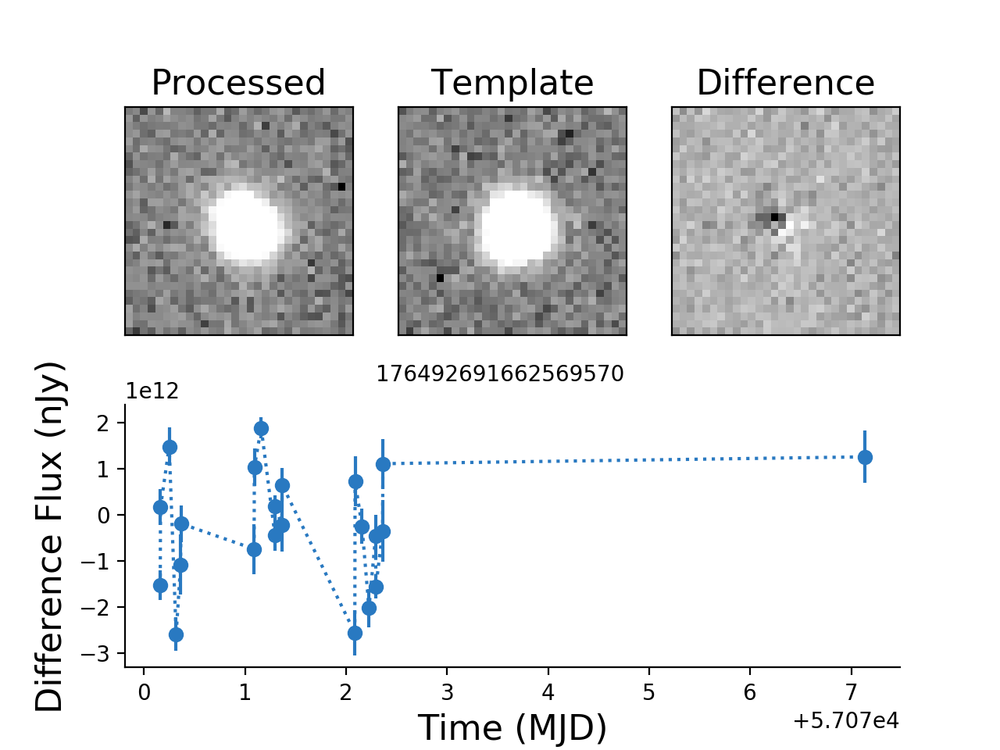

Template dataId {'filter': 'g', 'visit': 289450, 'ccdnum': 7}


<IPython.core.display.Javascript object>


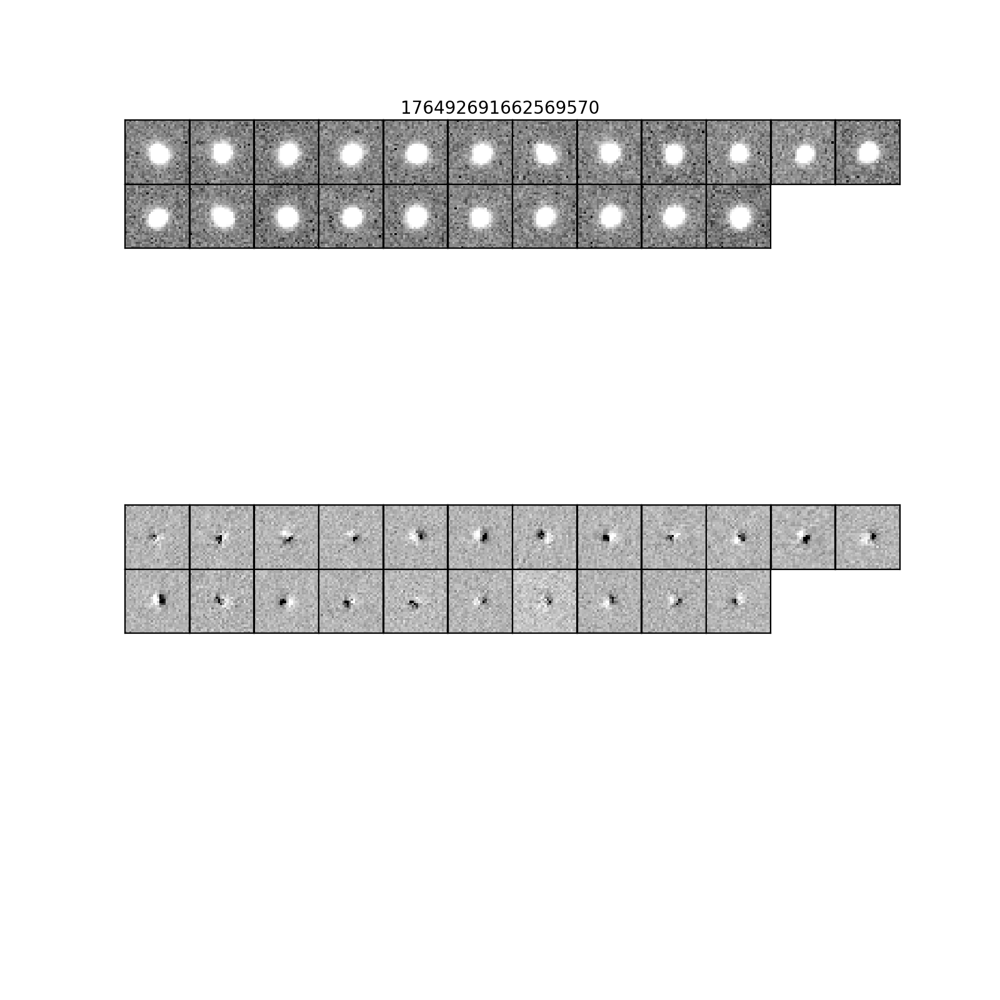

Loading PPDB Sources...
DIAObject ID: 176486717363060879
RA (deg): [150.15728073]
Dec (deg): [2.59905146]
Number of DIASources: 21


<IPython.core.display.Javascript object>


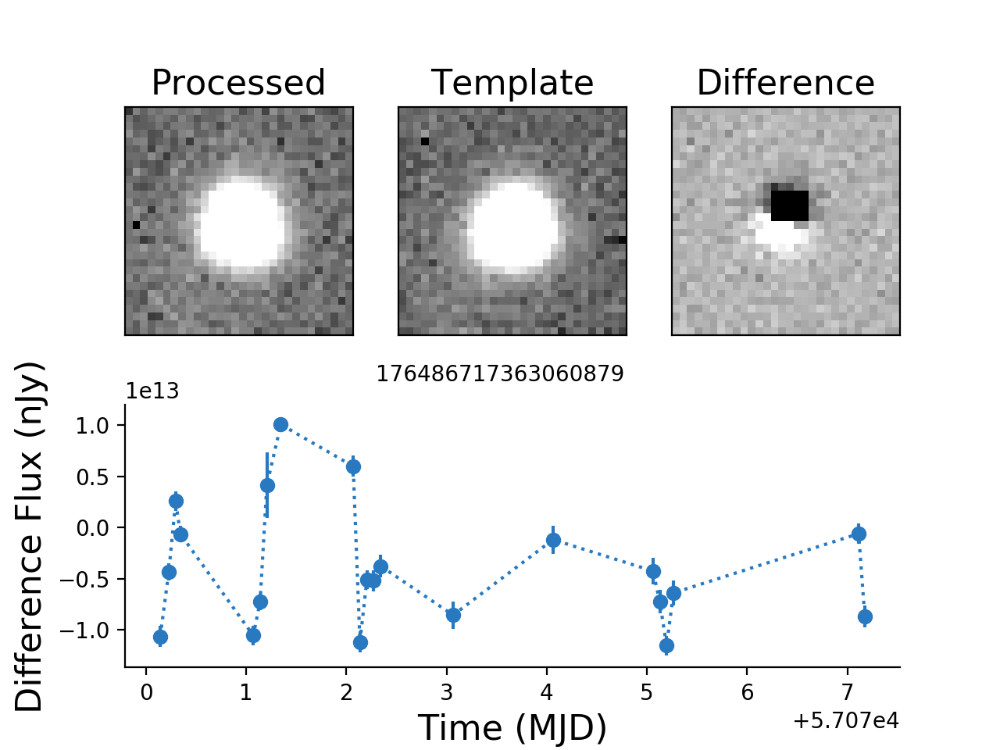

Template dataId {'filter': 'g', 'visit': 289444, 'ccdnum': 16}


<IPython.core.display.Javascript object>


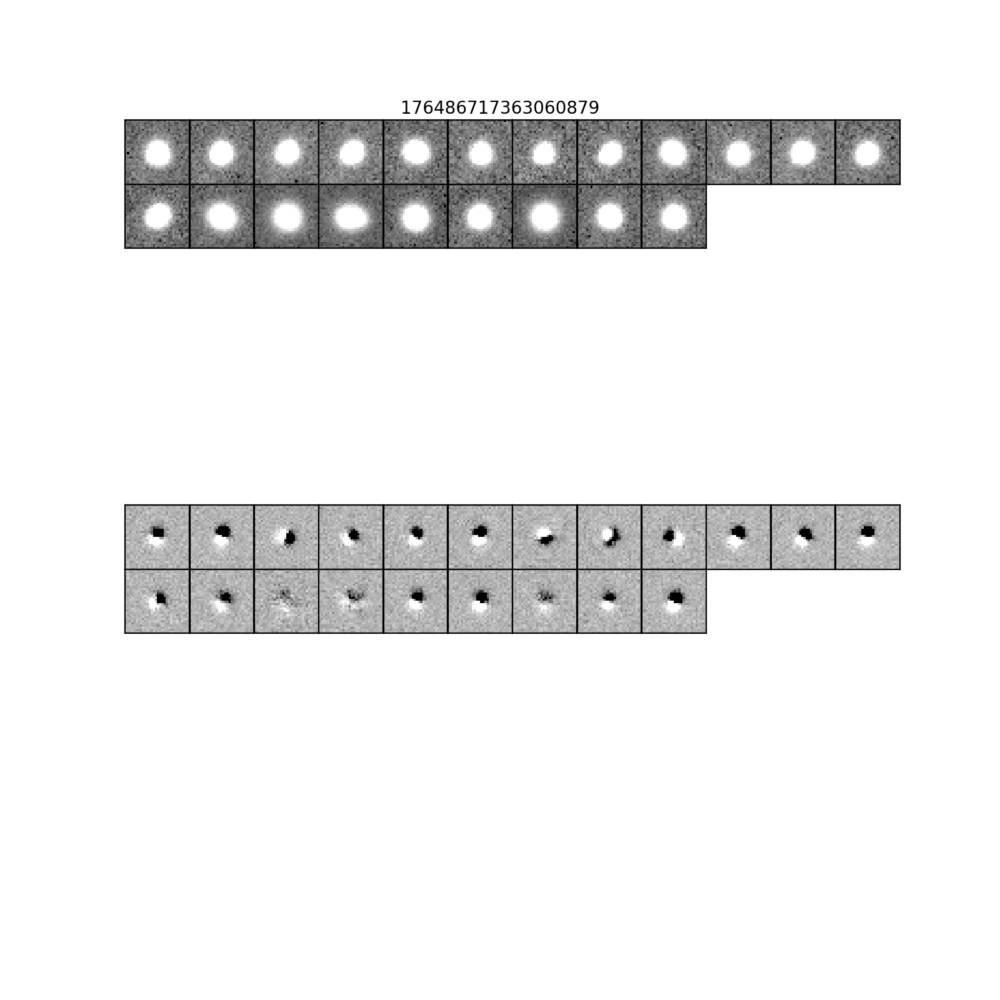

In [203]:
diffimRepo = '/project/gkovacs/hits_proc2019-07-03/repo/rerun/imgDiff_2019-07-04'
for obj in goodObjInst.loc[(goodObjInst['nDiaSources'] >= 20), 'diaObjectId'].values[0:2]:
    plc.plotLightcurve(obj, goodObjInst, repoInst, dbPathInst, repoInst, plotAllCutouts=True,
                       diffimRepo=diffimRepo, templateDataType='instcal', templateVisitList=[289444, 289449, 289450])

Loading PPDB Sources...
DIAObject ID: 176486730247962731
RA (deg): [149.31545461]
Dec (deg): [2.51719257]
Number of DIASources: 20


<IPython.core.display.Javascript object>


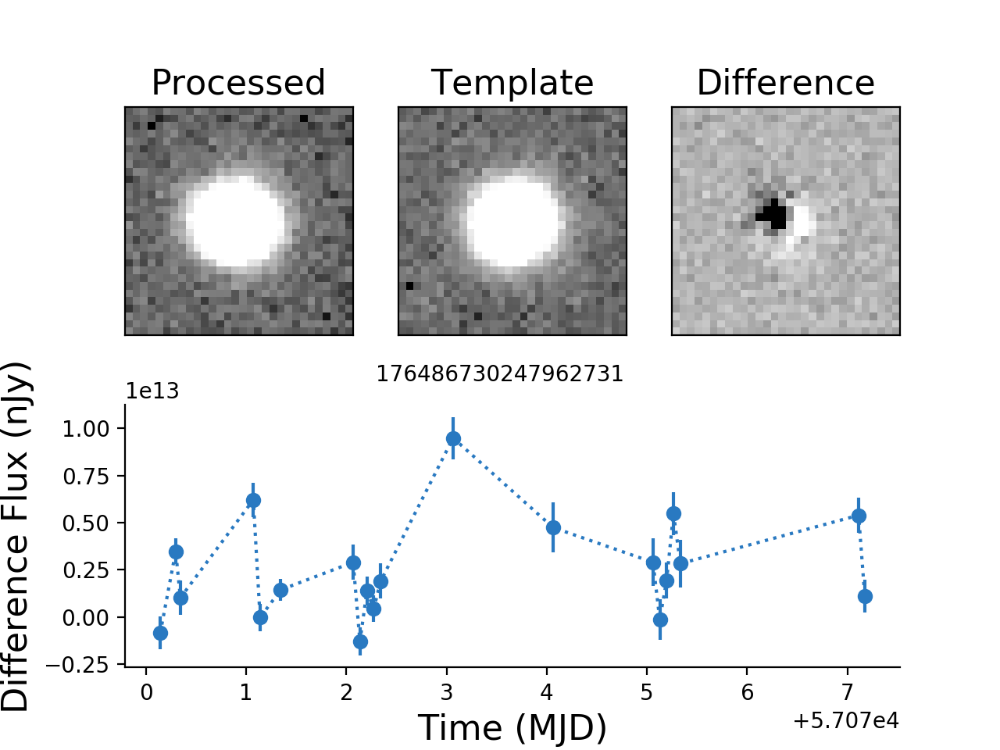

Template dataId {'filter': 'g', 'visit': 289444, 'ccdnum': 19}


<IPython.core.display.Javascript object>


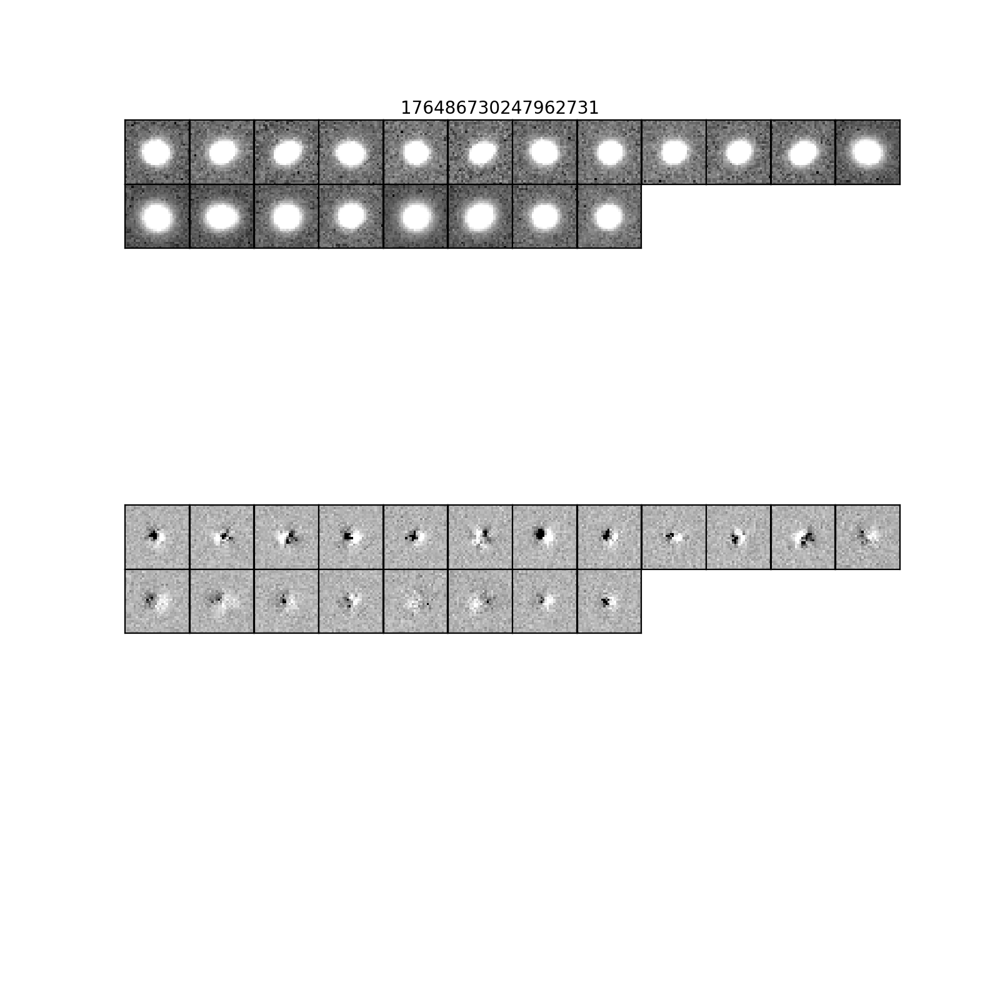

Loading PPDB Sources...
DIAObject ID: 176486751722799261
RA (deg): [150.82468495]
Dec (deg): [2.39874005]
Number of DIASources: 20


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


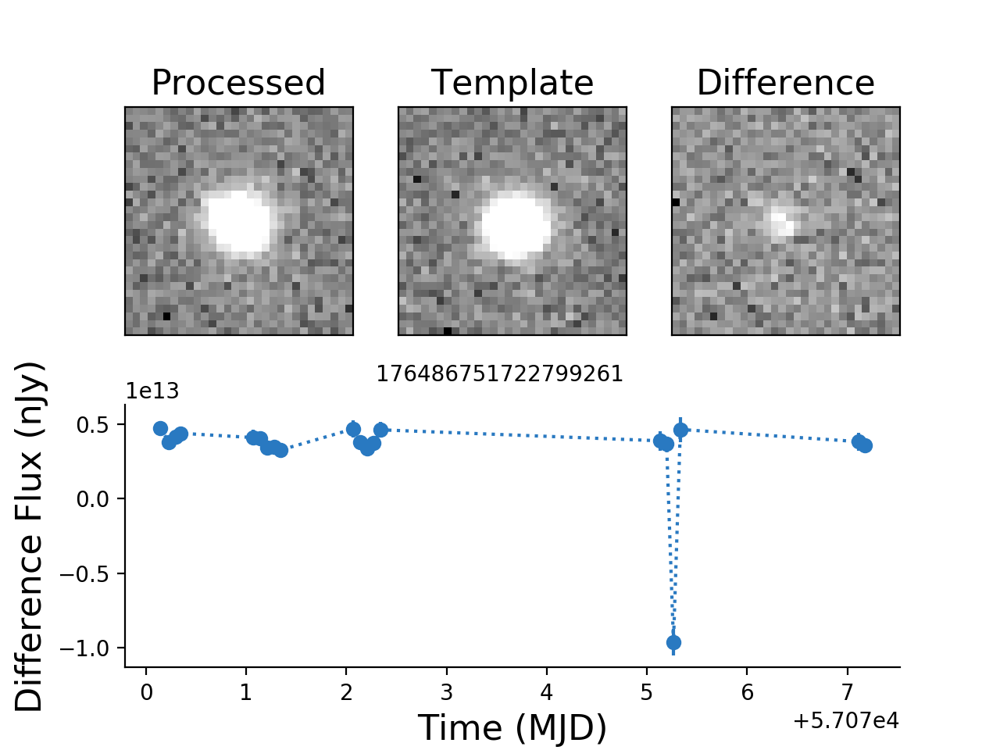

Template dataId {'filter': 'g', 'visit': 289444, 'ccdnum': 24}


<IPython.core.display.Javascript object>


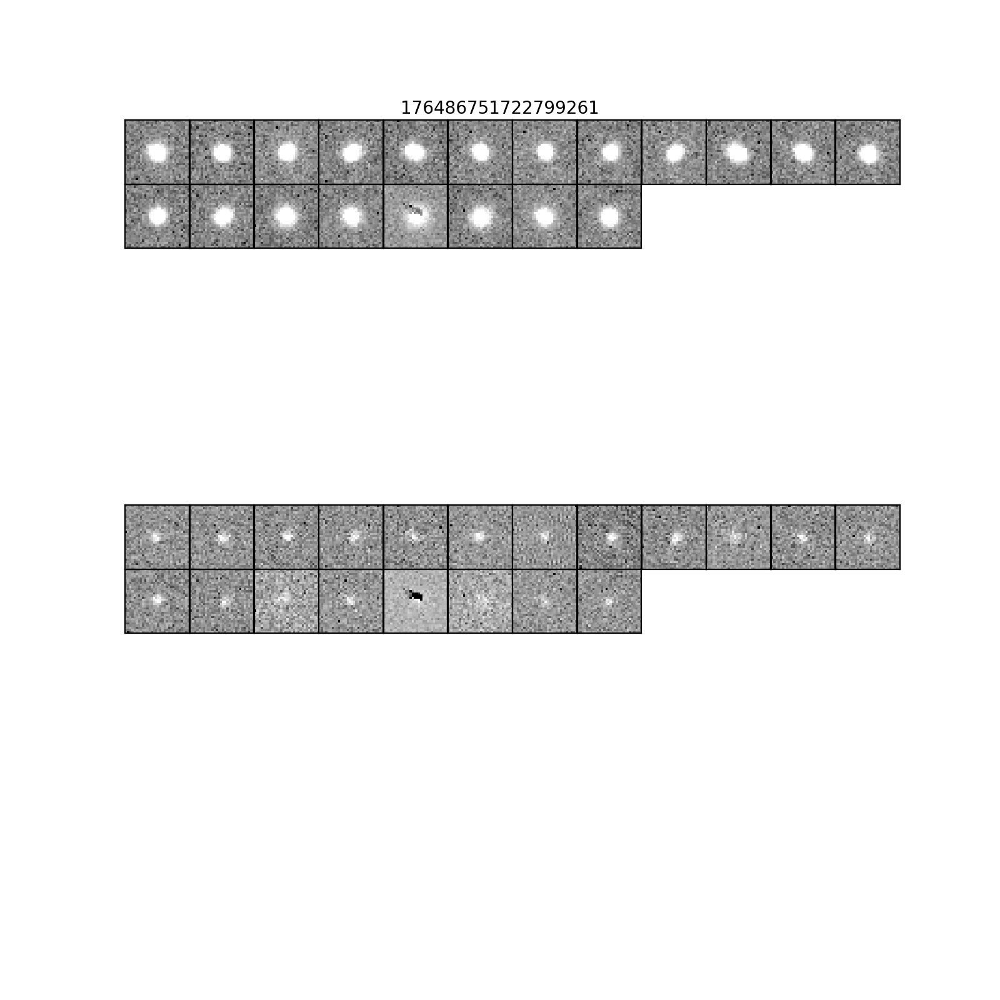

In [204]:
for obj in goodObjCalexp.loc[(goodObjCalexp['nDiaSources'] >= 20), 'diaObjectId'].values[0:2]:
    plc.plotLightcurve(obj, goodObjCalexp, repoCalexp, dbPathCalexp, repoCalexp, plotAllCutouts=True,
                       templateDataType='calexp', templateVisitList=[289444, 289449, 289450])